In [2]:
# !pip install tensorflow

In [15]:
# !pip install seaborn

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.linear_model import RidgeClassifier, LogisticRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

import catboost

# See data

In [7]:
sb = pd.read_csv('synthetic_classification/sample_submission.csv')

In [8]:
sb.head()

,y
0,4
1,4
2,1
3,4
4,1


In [9]:
train = pd.read_csv('synthetic_classification/train.csv')
test = pd.read_csv('synthetic_classification/test.csv')

In [10]:
test.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0,0.062889,0.165381,1.162462,-0.056768,-1.351731,-0.961493,-0.750833,-0.903557,-0.445757,0.745214,0.258075,-0.121580,-0.393850,-0.046711,1.894993
1,1,0.523779,-0.355856,0.634560,-0.004449,-1.023724,-1.217731,0.752013,0.882079,0.032268,0.177012,-0.644600,-1.789840,-0.859609,3.684528,0.558975
2,2,-0.607784,0.680510,-0.742773,0.277177,0.650926,0.540916,0.596682,-0.298720,2.534355,1.044621,1.185604,-1.208916,-1.632341,0.509383,-1.822971
3,3,-0.617596,-0.245540,0.659391,-0.550702,-1.581564,-0.254931,0.542597,-0.653591,-1.134535,-1.071286,-1.073722,-0.189326,-1.160799,2.155240,-0.059454
4,4,-0.265073,0.233774,0.265632,-2.040036,0.318772,-0.472257,-1.539412,0.722836,1.447968,1.017600,1.312207,-0.790148,1.166662,-0.876603,0.247692


In [20]:
train = train.drop(['Unnamed: 0'], axis=1)

In [21]:
train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,label
0,0.165202,-0.478520,-2.257107,-0.553981,1.765257,1.299021,-0.046894,0.666681,0.680690,-1.671282,-0.153746,-0.195847,-0.220067,2.566026,-1.570657,2
1,-0.224334,-0.767142,-0.240347,-0.051352,0.305125,-1.721982,-2.465773,-1.101852,0.897459,-1.206320,0.729931,0.403281,-0.005451,-1.395800,-1.634428,0
2,0.089218,0.399756,0.947436,0.319036,0.688324,1.496136,0.191788,0.007435,0.163002,-1.375127,0.187362,-0.016887,0.766921,-1.150965,0.379291,4
3,-0.195872,0.507818,-1.799445,-1.169515,-0.923603,0.183832,-0.424816,0.592742,-0.075206,-0.845360,-0.927943,-0.328885,-0.701013,-0.630973,0.405728,1
4,-0.243670,0.079381,-0.780691,-2.072413,-1.380842,-0.140338,0.497398,-1.527575,-0.034950,-1.539090,-0.581833,0.441491,-0.140839,0.120535,0.105580,2


In [22]:
train.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,label
count,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000,1125.000000
mean,0.024997,-0.003599,-0.006998,-0.032540,0.037369,0.015969,0.039719,-0.051728,-0.011779,0.034604,0.008461,-0.020940,0.018311,0.009878,-0.001175,1.997333
std,0.424059,0.455894,0.990591,0.970598,1.044421,0.957251,1.014819,1.019364,1.006066,0.993467,1.004728,1.005920,0.941126,1.005666,1.038087,1.417039
min,-1.076396,-1.181935,-3.320719,-3.796519,-3.212111,-3.302166,-3.508628,-3.353223,-3.679519,-3.484634,-3.140817,-3.921724,-2.994886,-3.424528,-3.625352,0.000000
25%,-0.250578,-0.272048,-0.702856,-0.666458,-0.698266,-0.657344,-0.609025,-0.772885,-0.724455,-0.639259,-0.659309,-0.672665,-0.574040,-0.693534,-0.664531,1.000000
50%,0.014634,0.014403,-0.014395,-0.012368,0.026508,0.008818,0.073957,-0.037964,-0.039668,0.055700,0.013790,-0.012606,0.026305,-0.001888,0.010394,2.000000
75%,0.321463,0.308043,0.662126,0.638842,0.780435,0.673414,0.717496,0.640333,0.662727,0.738368,0.735504,0.636028,0.608159,0.724261,0.693889,3.000000
max,1.258152,1.233632,3.341587,2.849160,3.403216,2.658760,3.111440,2.832463,3.175232,3.678056,2.683156,2.865483,3.004692,3.619937,3.039174,4.000000


In [23]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1125 entries, 0 to 1124
Data columns (total 16 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1125 non-null   float64
 1   1       1125 non-null   float64
 2   2       1125 non-null   float64
 3   3       1125 non-null   float64
 4   4       1125 non-null   float64
 5   5       1125 non-null   float64
 6   6       1125 non-null   float64
 7   7       1125 non-null   float64
 8   8       1125 non-null   float64
 9   9       1125 non-null   float64
 10  10      1125 non-null   float64
 11  11      1125 non-null   float64
 12  12      1125 non-null   float64
 13  13      1125 non-null   float64
 14  14      1125 non-null   float64
 15  label   1125 non-null   int64  
dtypes: float64(15), int64(1)
memory usage: 140.8 KB


In [24]:
# Данные в разных шкалах, рассмотрим распределения и корелляцию

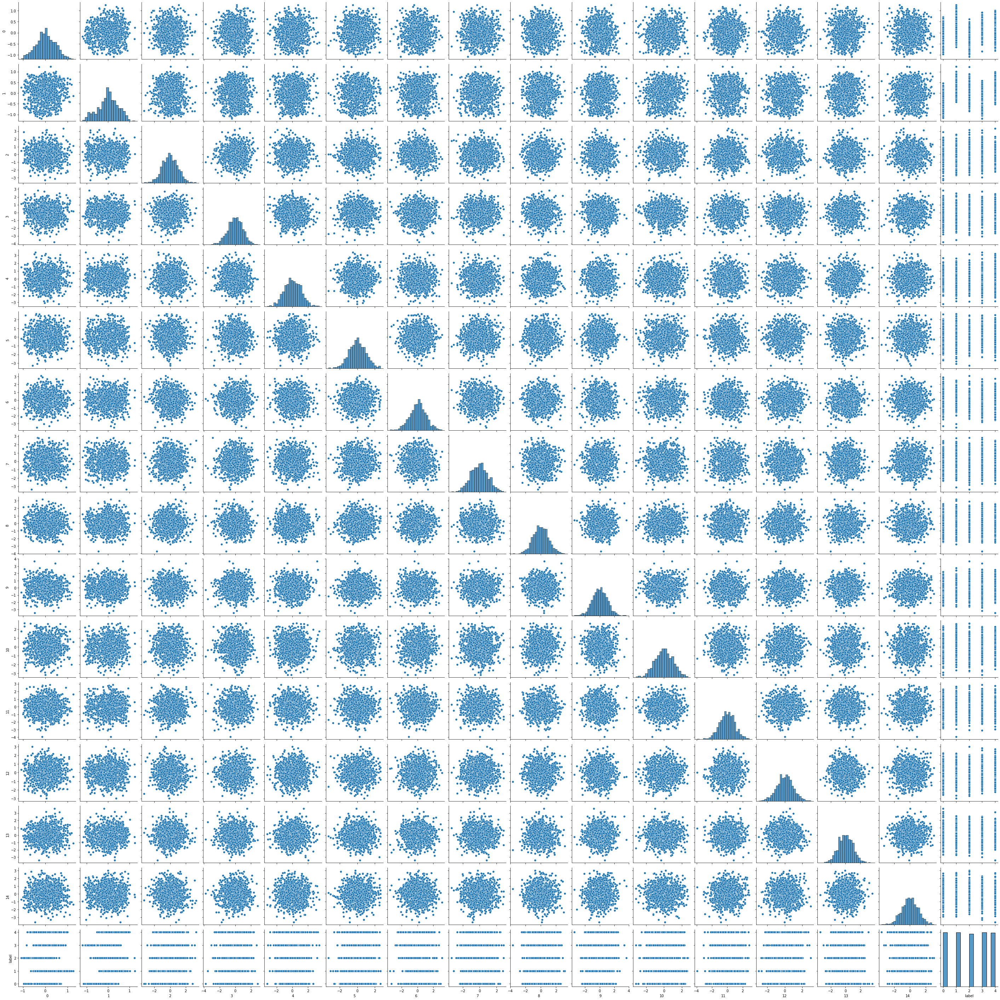

In [25]:
sns.pairplot(train)

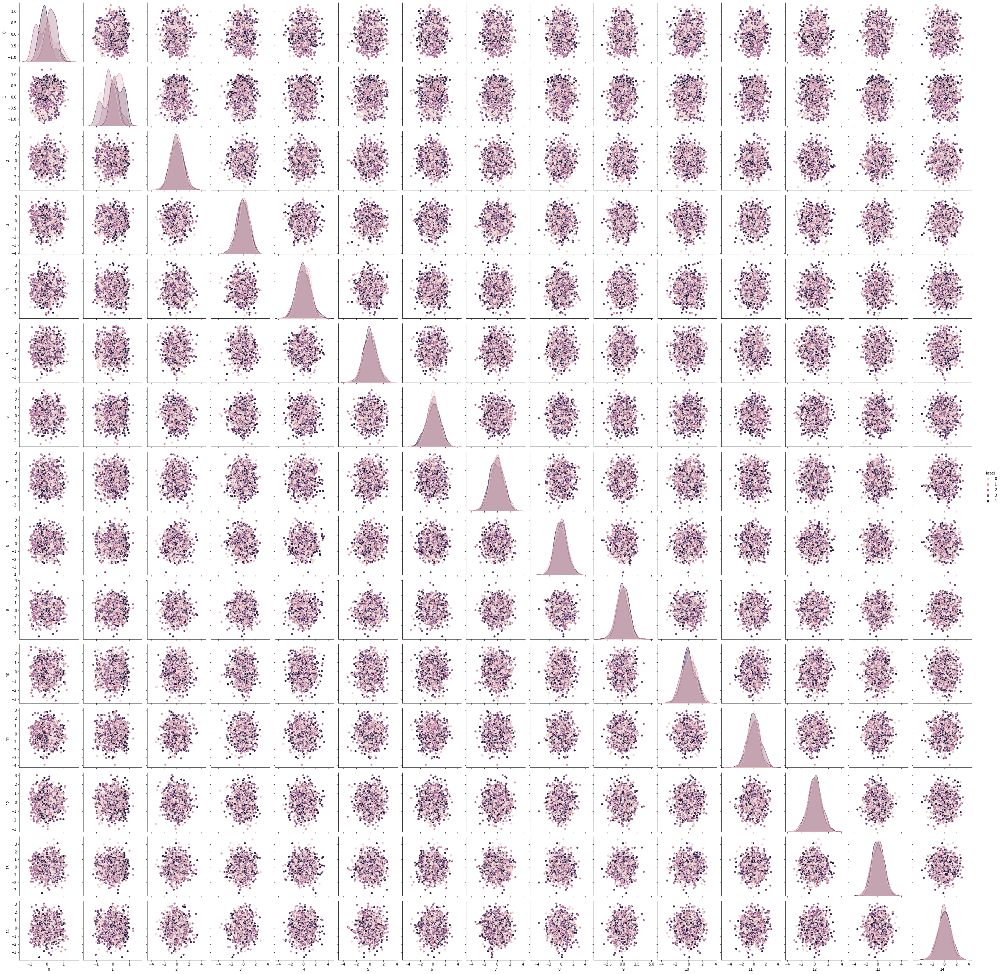

In [26]:
sns.pairplot(train, hue='label')

<AxesSubplot:>

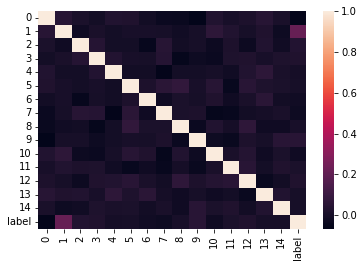

In [28]:
sns.heatmap(train.corr())

In [31]:
train['label'].value_counts()

1    227
0    226
3    226
4    225
2    221
Name: label, dtype: int64

# Learning

In [30]:
# Данные нормально распределены и не кореллируют, и нет бисбаланса в данных
# скорее всего подойдут 
# линейные методы классификации а также методы понижения размерности
# Также имеет смысл проверить фиче-селектион

### 1

In [34]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', GaussianProcessClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
cross_val_score(pipe, train.drop(['label'], axis=1), train['label']) # 5-fold

array([0.31111111, 0.29333333, 0.36      , 0.27111111, 0.32888889])

In [35]:
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5

0.3128888888888889

In [37]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('model', GaussianProcessClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5

0.3128888888888889

### 2

In [41]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RidgeClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5 # 5-fold

0.35911111111111105

In [40]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('model', RidgeClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5

0.35911111111111105

### 3

In [49]:

for solver in ['liblinear', 'saga']:
    pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('model', LogisticRegression(penalty='l1', random_state=0, solver=solver))
                    ])
    
    pipe.fit(train.drop(['label'], axis=1), train['label'])
    print(sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5) # 5-fold

0.3555555555555555
0.352


In [50]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('model', LogisticRegression(penalty='l1', random_state=0, solver='liblinear'))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5

0.3573333333333334

### 4

In [52]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5 # 5-fold

0.48533333333333334

In [53]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('model', RandomForestClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5

0.3635555555555555

### 5

In [54]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', GradientBoostingClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5 # 5-fold

0.4960000000000001

In [65]:
pipe = Pipeline([
    ('model', GradientBoostingClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5 # 5-fold

0.4960000000000001

In [55]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('model', GradientBoostingClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5

0.3315555555555556

### 6

In [57]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SGDClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5 # 5-fold

0.3288888888888889

In [58]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('model', SGDClassifier(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5

0.3288888888888889

### 7

In [59]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVC(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5 # 5-fold

0.35377777777777775

In [60]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('model', SVC(random_state=0))
])

pipe.fit(train.drop(['label'], axis=1), train['label'])
sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5

0.35377777777777775

In [63]:
for kernel in ['linear', 'poly', 'rbf', 'sigmoid']:
    pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('model', SVC(random_state=0, kernel=kernel))
    ])

    pipe.fit(train.drop(['label'], axis=1), train['label'])
    print(sum(cross_val_score(pipe, train.drop(['label'], axis=1), train['label'])) / 5) # 5-fold

0.33599999999999997
0.3528888888888889
0.35377777777777775
0.3413333333333333


In [ ]:
# Другие идеи

In [64]:
# Видно, хорошие результаты показали RandomForest GBDT

In [66]:
s = 0.4960000000000001
min(1, 2 * s)

0.9920000000000002

In [75]:
X_train, X_test, y_train, y_test = train_test_split(train.drop(['label'], axis=1), train['label'])

In [1]:
# model = catboost.CatBoostClassifier(eval_metric='Accuracy').fit(
#     X_train,
#     y_train,
#     plot=True, 
#     eval_set=(X_test, y_test))

In [98]:
model.predict(test.drop(['Unnamed: 0'], axis=1)).\
              reshape(1, -1)[0]

array([3, 3, 2, 2, 4, 0, 4, 4, 4, 0, 3, 3, 2, 1, 4, 0, 3, 4, 2, 0, 0, 1,
       1, 2, 4, 2, 3, 4, 4, 1, 4, 3, 1, 0, 2, 4, 4, 2, 2, 1, 4, 1, 1, 1,
       1, 0, 0, 4, 2, 0, 2, 2, 4, 4, 3, 1, 4, 2, 4, 2, 0, 3, 4, 0, 4, 1,
       4, 4, 2, 3, 4, 3, 1, 3, 0, 4, 0, 1, 1, 0, 1, 4, 3, 1, 1, 3, 1, 4,
       4, 2, 0, 3, 2, 0, 1, 3, 2, 4, 3, 0, 3, 1, 4, 4, 2, 3, 4, 1, 3, 3,
       2, 0, 3, 2, 1, 4, 1, 3, 3, 4, 0, 0, 3, 2, 0, 3, 2, 1, 4, 1, 2, 2,
       2, 4, 1, 1, 0, 1, 1, 1, 0, 4, 3, 0, 0, 1, 0, 2, 3, 0, 2, 0, 1, 3,
       4, 2, 1, 1, 3, 2, 4, 2, 2, 4, 1, 1, 2, 2, 1, 3, 2, 2, 3, 4, 1, 0,
       1, 3, 1, 0, 0, 3, 1, 3, 4, 4, 4, 4, 4, 4, 2, 2, 0, 0, 3, 3, 1, 1,
       0, 1, 1, 3, 1, 4, 1, 0, 4, 0, 3, 4, 4, 1, 2, 4, 1, 1, 3, 1, 0, 3,
       4, 0, 1, 2, 1, 3, 0, 2, 1, 1, 2, 0, 0, 0, 3, 0, 4, 2, 3, 4, 2, 4,
       2, 2, 4, 0, 1, 4, 0, 0, 1, 1, 1, 2, 3, 3, 3, 2, 3, 0, 2, 0, 2, 4,
       2, 3, 1, 2, 2, 1, 0, 2, 3, 3, 3, 2, 0, 1, 3, 3, 2, 3, 3, 2, 0, 3,
       0, 4, 4, 0, 4, 0, 4, 4, 0, 0, 0, 4, 0, 3, 2,

In [79]:
min(1, 2 * (accuracy_score(y_test, model.predict(X_test))))

1

In [80]:
# Теперь можно обучиться на полном наборе и делать предсказание

In [2]:
# model = catboost.CatBoostClassifier(eval_metric='Accuracy').fit(
#     train.drop(['label'], axis=1), train['label'],
#     plot=True, 
#     eval_set=(X_test, y_test))

In [95]:
pd.DataFrame({'y':model.predict(test.drop(['Unnamed: 0'], axis=1)).\
              reshape(1, -1)[0]}).to_csv('submission.csv', index=False)

In [96]:
model.predict(test.drop(['Unnamed: 0'], axis=1)).\
              reshape(1, -1)[0]

array([1, 0, 2, 2, 1, 0, 1, 4, 4, 0, 3, 3, 2, 1, 4, 0, 3, 4, 2, 3, 3, 1,
       1, 2, 4, 2, 3, 4, 4, 2, 1, 3, 1, 0, 2, 4, 4, 2, 2, 1, 4, 3, 1, 1,
       1, 0, 2, 4, 2, 0, 2, 2, 4, 4, 0, 1, 4, 2, 4, 2, 2, 0, 1, 0, 4, 4,
       1, 4, 2, 3, 4, 0, 4, 3, 0, 1, 0, 3, 1, 0, 1, 4, 3, 1, 4, 3, 1, 1,
       4, 2, 0, 0, 2, 0, 1, 0, 2, 4, 0, 0, 0, 1, 4, 4, 2, 3, 4, 1, 3, 0,
       2, 0, 0, 2, 1, 3, 4, 3, 3, 1, 0, 0, 3, 2, 0, 3, 2, 4, 4, 4, 2, 2,
       2, 4, 1, 1, 0, 3, 2, 4, 0, 4, 3, 3, 0, 4, 0, 0, 3, 4, 2, 3, 0, 3,
       4, 2, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 2, 2, 1, 3, 4, 2, 0, 4, 2, 0,
       1, 3, 4, 0, 0, 3, 1, 1, 4, 1, 4, 4, 4, 4, 2, 2, 0, 0, 3, 3, 1, 1,
       3, 1, 4, 1, 1, 1, 4, 0, 4, 3, 3, 4, 4, 1, 2, 1, 1, 1, 3, 1, 0, 3,
       4, 0, 0, 2, 3, 3, 3, 2, 1, 1, 2, 0, 0, 0, 0, 3, 3, 2, 1, 4, 0, 4,
       4, 2, 2, 3, 4, 2, 0, 0, 4, 1, 1, 2, 3, 3, 3, 2, 3, 0, 2, 0, 2, 1,
       2, 3, 1, 2, 2, 1, 3, 2, 0, 3, 0, 2, 0, 1, 3, 3, 4, 3, 3, 0, 0, 0,
       3, 4, 4, 0, 4, 2, 4, 1, 3, 3, 2, 4, 3, 0, 2,